In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import arviz as az
import matplotlib.pyplot as plt
import models
import numpy as np
import pymc as pm
import seaborn as sns

sns.set_theme('notebook', 'ticks', 'colorblind')
sns_histplot_args = dict(stat='density', element='step', fill=False)

Here we define a Gaussian beam with a fixed opening angle and choose the expected counts so that we have $\sim 5 \sigma$ detections when face-on at the EM horizon.

In [3]:
d_em_horiz = 0.3
scatter = np.log(10) # 1 dex scatter
def F_ex(x, d, scatter=True):
    L0 = 25.0*(0.01 - 0.99*(x-1)*(x+1))/np.square(d/d_em_horiz)
    if scatter:
        return np.random.lognormal(mean=np.log(L0), sigma=scatter)
    else:
        return L0

Text(0, 0.5, '$\\left\\langle F\\left(x, d=d_\\mathrm{horiz} \\right) \\right\\rangle$')

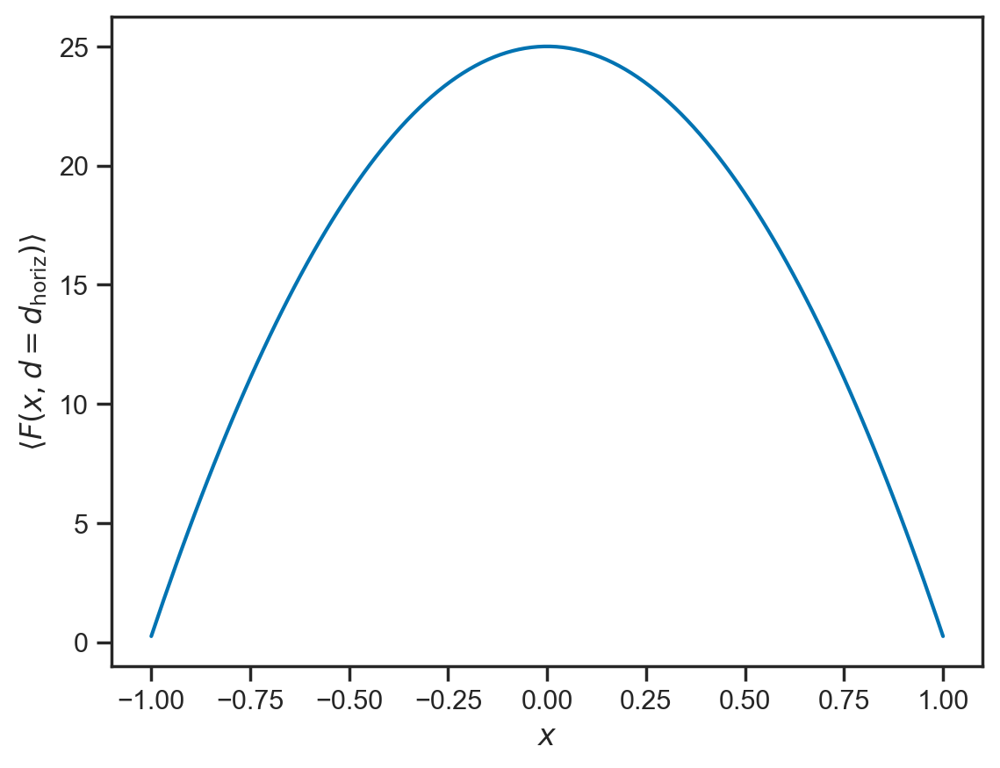

In [4]:
x = np.linspace(-1, 1, 128)
plt.plot(x, F_ex(x, d_em_horiz, scatter=False))
plt.xlabel(r'$x$')
plt.ylabel(r'$\left\langle F\left(x, d=d_\mathrm{horiz} \right) \right\rangle$')

Here we will analyze 128 events:

In [5]:
hmin = 0.35
hmax = 1.4
nobs = 128
em_detected, x_true, d_true, z_true, Al_true, Ar_true, Al, Ar, Ndraw = models.draw_gws(F_ex, 32768)

d_max_em_detected = np.max(z_true[em_detected])/hmin

assert nobs < np.sum(em_detected)

100%|██████████████████████████████████| 32768/32768 [00:02<00:00, 10945.73it/s]


The GW horizon seems to be somewhere around 0.3:

Text(0.5, 1.0, 'GW Detections')

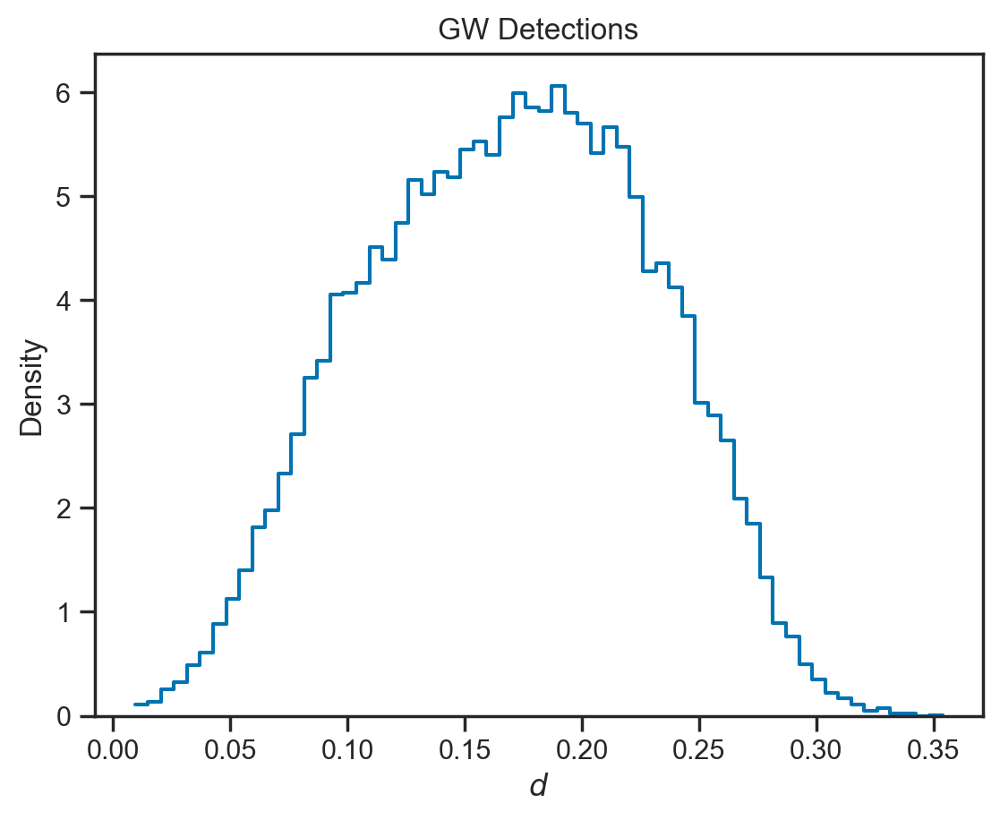

In [6]:
sns.histplot(d_true, **sns_histplot_args)
plt.xlabel(r'$d$')
plt.title('GW Detections')

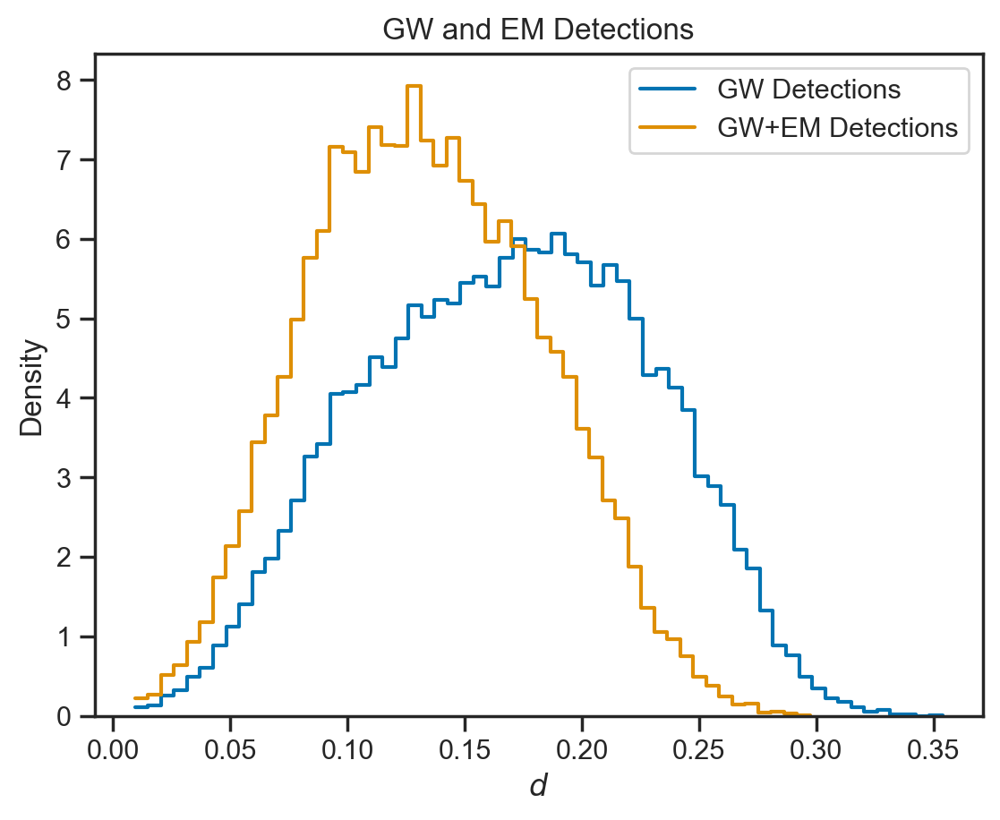

In [7]:
sns.histplot(d_true, label='GW Detections', **sns_histplot_args)
sns.histplot([d for (d, e) in zip(d_true, em_detected) if e], label='GW+EM Detections', **sns_histplot_args)
plt.xlabel(r'$d$')
plt.title('GW and EM Detections')
plt.legend()

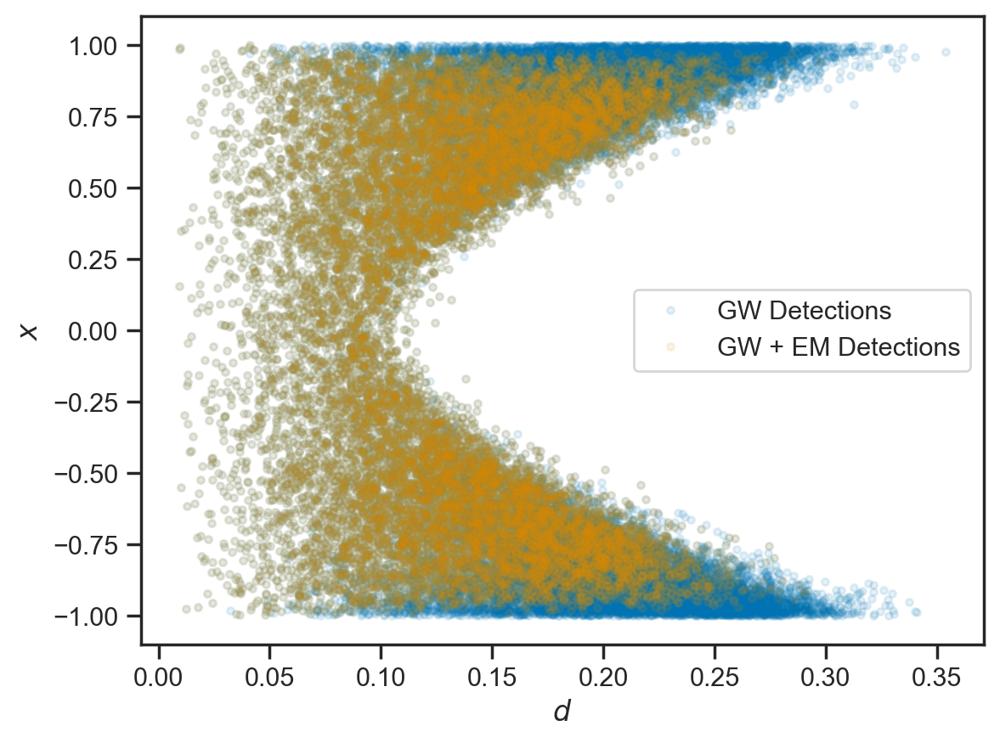

In [8]:
plt.plot(d_true, x_true, '.', label='GW Detections', alpha=0.1)
plt.plot([d for (d,e) in zip(d_true, em_detected) if e],
         [x for (x,e) in zip(x_true, em_detected) if e],
         '.',
         label='GW + EM Detections',
         alpha=0.1)
plt.xlabel(r'$d$')
plt.ylabel(r'$x$')
plt.legend()

First, we will run the model on the GW-selected events *as if* we had a redshift for every one:

In [9]:
model_gw_only = models.make_model(Al[:nobs], Ar[:nobs], z_true[:nobs], x_true, d_true, Ndraw, hmin=hmin, hmax=hmax)

In [10]:
with model_gw_only:
    trace_gw_only = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [h, x]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Chain <xarray.DataArray 'chain' ()>
array(0)
Coordinates:
    chain    int64 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(1)
Coordinates:
    chain    int64 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(2)
Coordinates:
    chain    int64 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(3)
Coordinates:
    chain    int64 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [11]:
az.summary(trace_gw_only)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
h,0.706,0.007,0.693,0.717,0.000,0.000,977.0,1762.0,1.0
x[0],-0.842,0.039,-0.915,-0.769,0.001,0.000,5599.0,2389.0,1.0
x[1],0.807,0.056,0.700,0.914,0.001,0.001,4579.0,1804.0,1.0
x[2],-0.934,0.047,-1.000,-0.849,0.001,0.001,2414.0,1213.0,1.0
x[3],0.680,0.039,0.609,0.755,0.001,0.000,5641.0,2789.0,1.0
...,...,...,...,...,...,...,...,...,...
Ar[123],18.903,1.008,17.052,20.866,0.011,0.008,8110.0,2917.0,1.0
Ar[124],15.041,0.976,13.234,16.967,0.012,0.009,7116.0,2381.0,1.0
Ar[125],2.415,0.388,1.724,3.140,0.005,0.003,6626.0,2717.0,1.0
Ar[126],0.047,0.052,0.000,0.144,0.001,0.001,3334.0,1633.0,1.0


array([[<Axes: title={'center': 'h'}>, <Axes: title={'center': 'h'}>],
       [<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>],
       [<Axes: title={'center': 'd'}>, <Axes: title={'center': 'd'}>],
       [<Axes: title={'center': 'Al'}>, <Axes: title={'center': 'Al'}>],
       [<Axes: title={'center': 'Ar'}>, <Axes: title={'center': 'Ar'}>]],
      dtype=object)

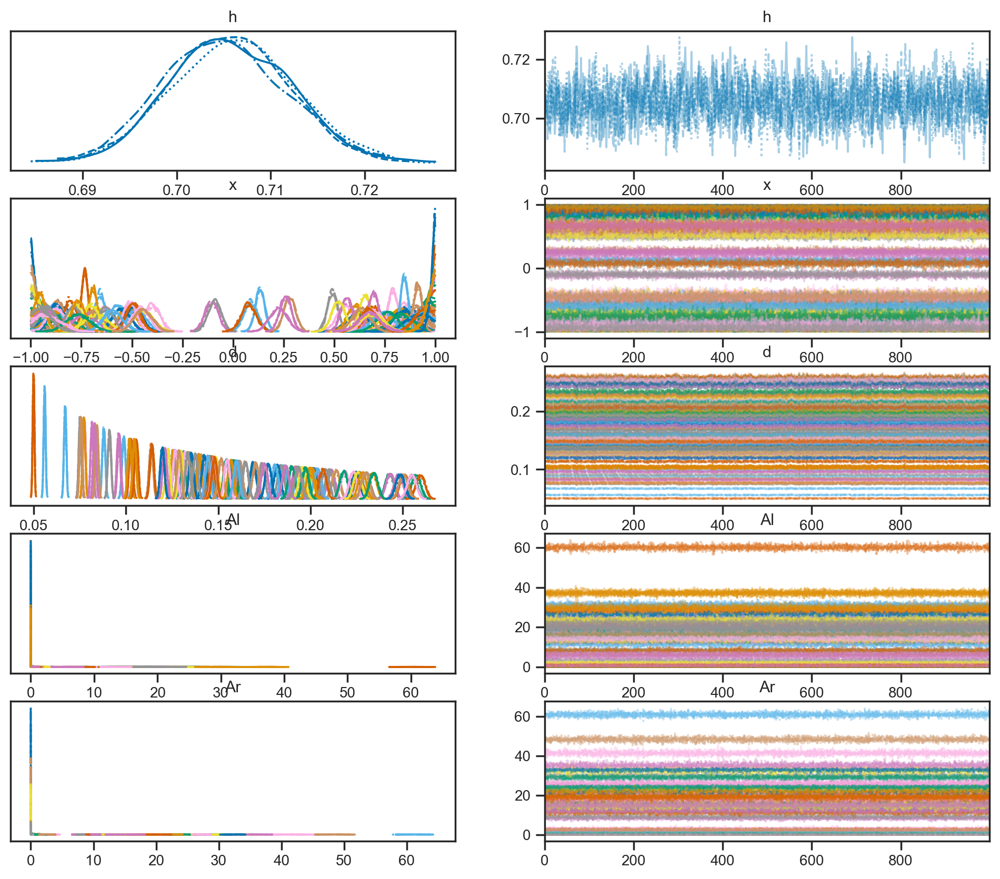

In [12]:
az.plot_trace(trace_gw_only)

Now we will run the model on the *EM selected* events, but without accounting for the different $x$ and $d$ distributions:

In [13]:
model_em_nocorrection = models.make_model(Al[em_detected][:nobs], Ar[em_detected][:nobs], z_true[em_detected][:nobs], x_true, d_true, Ndraw)
with model_em_nocorrection:
    trace_em_nocorrection = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [h, x]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Chain <xarray.DataArray 'chain' ()>
array(0)
Coordinates:
    chain    int64 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(1)
Coordinates:
    chain    int64 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(2)
Coordinates:
    chain    int64 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(3)
Coordinates:
    chain    int64 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [14]:
az.summary(trace_em_nocorrection)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
h,0.671,0.007,0.658,0.683,0.000,0.000,718.0,1176.0,1.0
x[0],-0.889,0.040,-0.962,-0.812,0.001,0.000,4125.0,2059.0,1.0
x[1],-0.671,0.042,-0.745,-0.590,0.001,0.000,6193.0,2553.0,1.0
x[2],-0.930,0.047,-1.000,-0.846,0.001,0.001,3326.0,1772.0,1.0
x[3],-0.964,0.027,-1.000,-0.916,0.000,0.000,3373.0,1950.0,1.0
...,...,...,...,...,...,...,...,...,...
Ar[123],0.028,0.036,0.000,0.096,0.001,0.000,2928.0,1822.0,1.0
Ar[124],19.336,0.977,17.520,21.136,0.012,0.009,6918.0,2116.0,1.0
Ar[125],0.198,0.105,0.011,0.378,0.001,0.001,5096.0,1837.0,1.0
Ar[126],14.702,0.940,12.982,16.467,0.012,0.008,6715.0,2737.0,1.0


array([[<Axes: title={'center': 'h'}>, <Axes: title={'center': 'h'}>],
       [<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>],
       [<Axes: title={'center': 'd'}>, <Axes: title={'center': 'd'}>],
       [<Axes: title={'center': 'Al'}>, <Axes: title={'center': 'Al'}>],
       [<Axes: title={'center': 'Ar'}>, <Axes: title={'center': 'Ar'}>]],
      dtype=object)

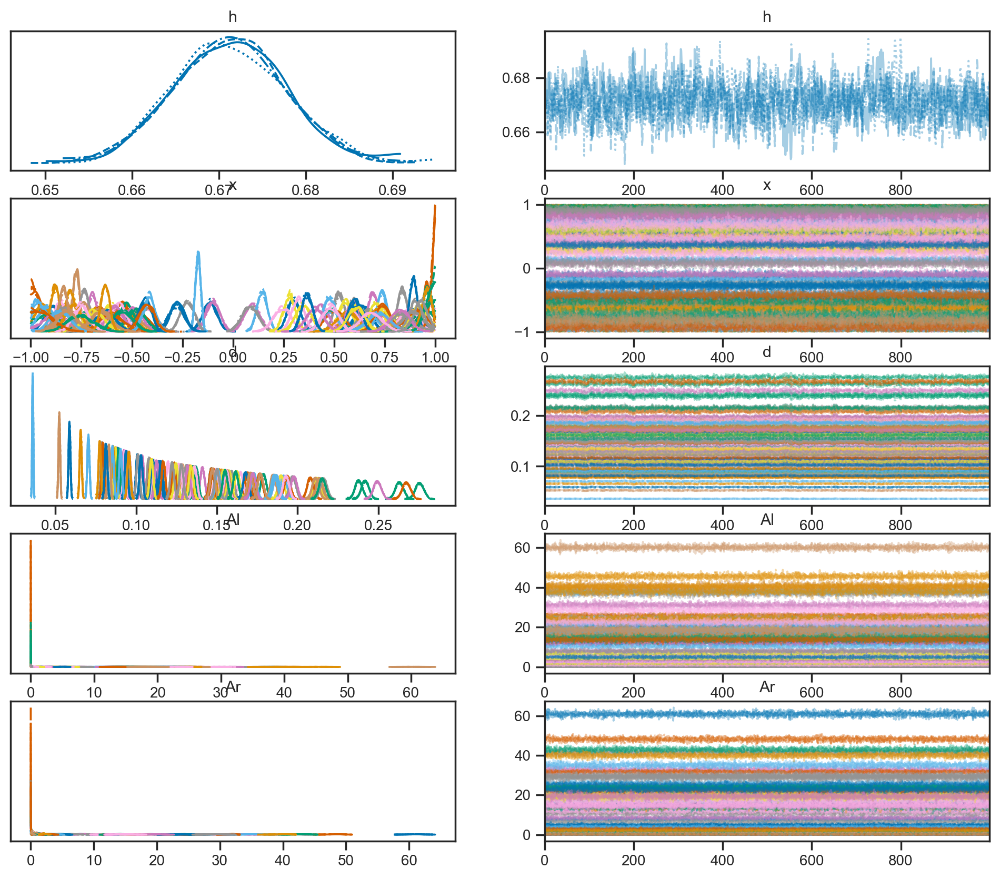

In [15]:
az.plot_trace(trace_em_nocorrection)

So, without accounting for EM selection effects, we see that we will be strongly biased in our measurement:

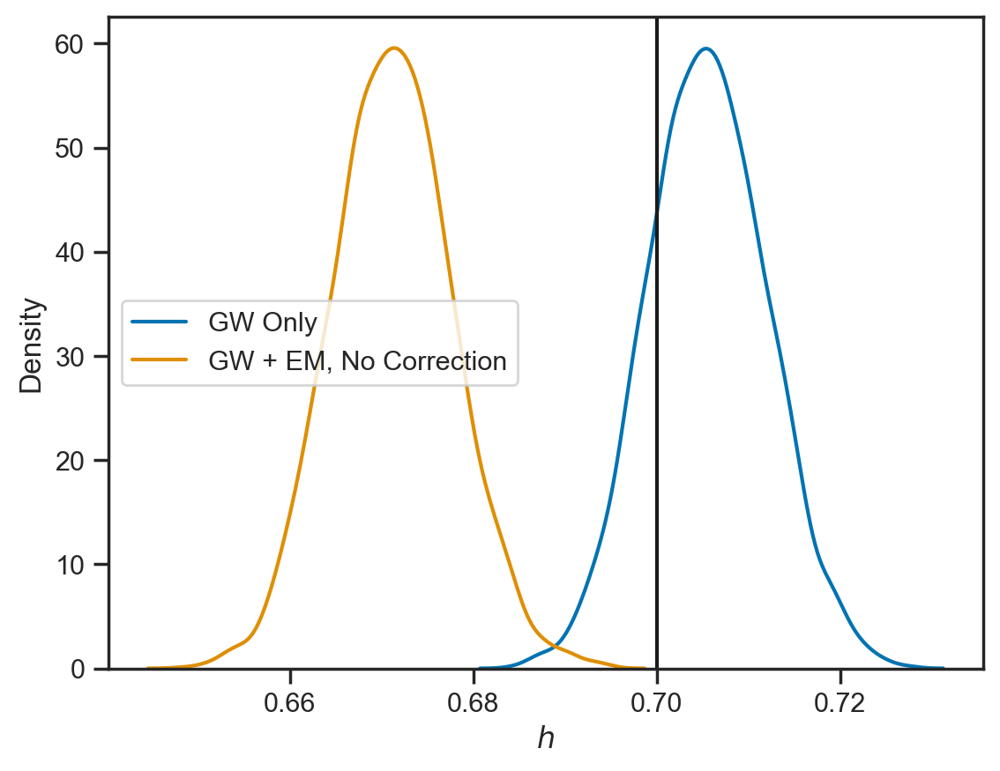

In [16]:
sns.kdeplot(trace_gw_only.posterior.h.values.flatten(), label='GW Only')
sns.kdeplot(trace_em_nocorrection.posterior.h.values.flatten(), label='GW + EM, No Correction')
plt.axvline(0.7, color='k')
plt.xlabel(r'$h$')
plt.legend()

Now let's try correcting (learning) the EM selection function:

In [17]:
sel_thin = 16
model_em_correction = models.make_model(Al[em_detected][:nobs], Ar[em_detected][:nobs], z_true[em_detected][:nobs], x_true[::sel_thin], d_true[::sel_thin], Ndraw/sel_thin, correct_em=True, log_L0_guess = -2*np.log(np.median(trace_em_nocorrection.posterior.d.values.flatten())))
with model_em_correction:
    trace_em_correction = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [h, x, fl, log_L0, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 37 seconds.
Chain <xarray.DataArray 'chain' ()>
array(0)
Coordinates:
    chain    int64 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(1)
Coordinates:
    chain    int64 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(2)
Coordinates:
    chain    int64 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(3)
Coordinates:
    chain    int64 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [18]:
az.summary(trace_em_correction, var_names=['fl', 'log_L0', 'sigma', 'h'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
fl[1],-0.124,0.252,-0.582,0.374,0.005,0.004,3028.0,2597.0,1.0
fl[2],-1.016,0.649,-2.221,0.143,0.012,0.009,3098.0,2868.0,1.0
fl[3],0.534,0.478,-0.363,1.428,0.010,0.007,2385.0,2357.0,1.0
fl[4],-1.142,0.609,-2.295,-0.035,0.014,0.010,1870.0,2673.0,1.0
log_L0,3.117,0.421,2.321,3.890,0.008,0.006,2726.0,2739.0,1.0
sigma,0.992,0.314,0.453,1.588,0.005,0.004,3284.0,2595.0,1.0
h,0.694,0.008,0.681,0.710,0.000,0.000,457.0,768.0,1.0


array([[<Axes: title={'center': 'fl'}>, <Axes: title={'center': 'fl'}>],
       [<Axes: title={'center': 'log_L0'}>,
        <Axes: title={'center': 'log_L0'}>],
       [<Axes: title={'center': 'h'}>, <Axes: title={'center': 'h'}>],
       [<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'd'}>, <Axes: title={'center': 'd'}>],
       [<Axes: title={'center': 'inc_dependent_flux_factor'}>,
        <Axes: title={'center': 'inc_dependent_flux_factor'}>],
       [<Axes: title={'center': 'Al'}>, <Axes: title={'center': 'Al'}>],
       [<Axes: title={'center': 'Ar'}>, <Axes: title={'center': 'Ar'}>],
       [<Axes: title={'center': 'Neff'}>,
        <Axes: title={'center': 'Neff'}>]], dtype=object)

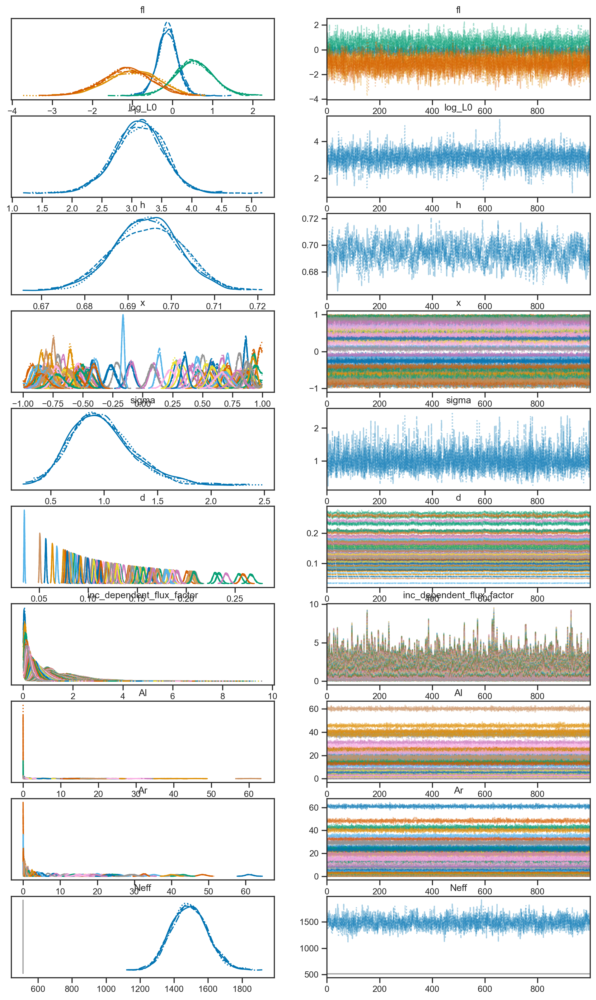

In [19]:
az.plot_trace(trace_em_correction, lines=[('Neff', {}, 4*nobs)])

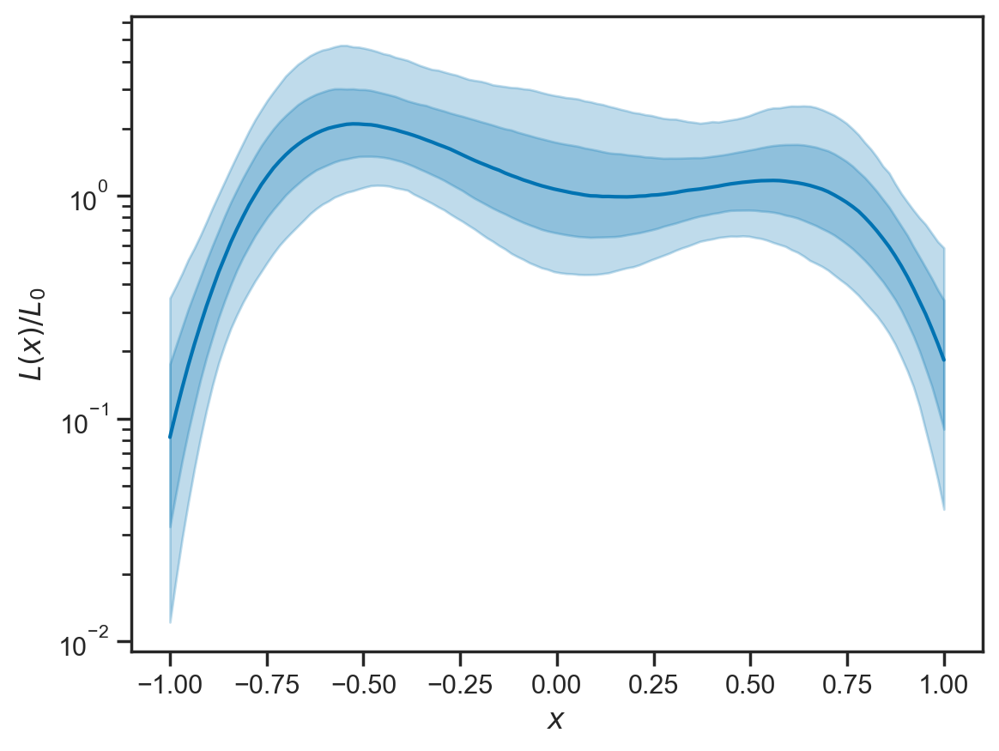

In [20]:
l, = plt.plot(trace_em_correction.posterior.xinterp, trace_em_correction.posterior.inc_dependent_flux_factor.median(dim=('chain', 'draw')))
plt.fill_between(trace_em_correction.posterior.xinterp, trace_em_correction.posterior.inc_dependent_flux_factor.quantile(0.84, dim=('chain', 'draw')), trace_em_correction.posterior.inc_dependent_flux_factor.quantile(0.16, dim=('chain', 'draw')), color=l.get_color(), alpha=0.25)
plt.fill_between(trace_em_correction.posterior.xinterp, trace_em_correction.posterior.inc_dependent_flux_factor.quantile(0.975, dim=('chain', 'draw')), trace_em_correction.posterior.inc_dependent_flux_factor.quantile(0.025, dim=('chain', 'draw')), color=l.get_color(), alpha=0.25)
plt.xlabel(r'$x$')
plt.ylabel(r'$L(x)/L_0$')
plt.yscale('log')

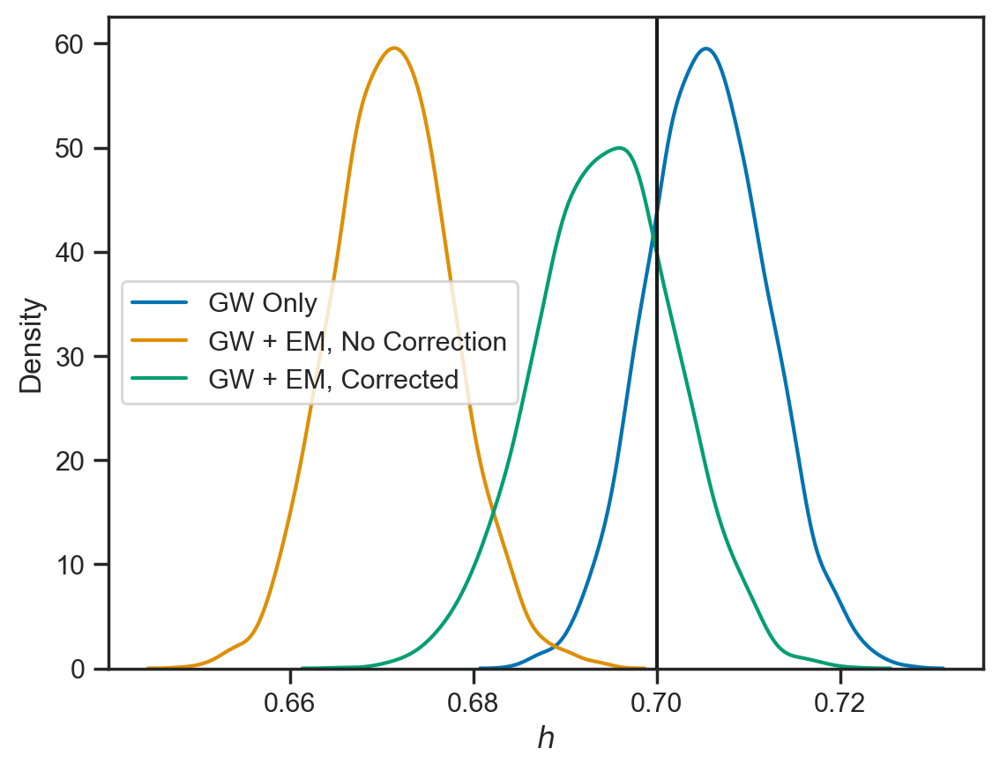

In [21]:
sns.kdeplot(trace_gw_only.posterior.h.values.flatten(), label='GW Only')
sns.kdeplot(trace_em_nocorrection.posterior.h.values.flatten(), label='GW + EM, No Correction')
sns.kdeplot(trace_em_correction.posterior.h.values.flatten(), label='GW + EM, Corrected')
plt.axvline(0.7, color='k')
plt.xlabel(r'$h$')
plt.legend()